# Práctica 1 Análisis exploratorio
## 1. Identificar las entidades (que es lo que puede ser sujeto de estudio) del conjunto. Agregalo como un comentario en tu script
### Las entidades que pueden ser analizadas de este conjunto son:
1. Sueldo Neto
2. Dependencia
3. Fecha
4. Tipo

In [93]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [80]:
data_url=("https://raw.githubusercontent.com/ppGodel/data_mining/main/csv/typed_uanl.csv")
df=pd.read_csv(data_url)
#Renombramos las columnas para mejor manipulación de los datos.
df.rename(columns={'Sueldo Neto': 'Sueldo_Neto','dependencia': 'Dependencia'}, inplace=True)
# Asegurarse de que Sueldo_Neto sea numérico y manejar nulos si es necesario
df['Sueldo_Neto'] = pd.to_numeric(df['Sueldo_Neto'], errors='coerce')
df.head()

# Las entidades identificadas en este conjunto son: Sueldo neto, Dependencia, Fecha y Tipo.

,Nombre,Sueldo_Neto,Dependencia,Fecha,Tipo
0,BRENDA AZENETH PICAZO GARCIA,8620.34,JUNTA DE GOBIERNO,2019-12-01,ADMIN
1,MARIA BEATRIZ VILLAGOMEZ GONZALEZ,7401.35,JUNTA DE GOBIERNO,2019-12-01,ADMIN
2,MARTHA ALICIA SILVA HERNANDEZ,5326.98,JUNTA DE GOBIERNO,2019-12-01,ADMIN
3,ALBERTINA DAVILA PUENTE,9483.10,RECTORIA,2019-12-01,ADMIN
4,AMELIA GRACIELA MARTINEZ DE LA PENA,9278.10,RECTORIA,2019-12-01,ADMIN


## 2. Obtener las estadisticas (descriptiva) de cada entidad (min, max, avg, std)

In [3]:
# Obtenemos los datos generales de el conjunto de datos.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 636201 entries, 0 to 636200
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Nombre       636201 non-null  object 
 1   Sueldo_Neto  636201 non-null  float64
 2   Dependencia  636201 non-null  object 
 3   Fecha        636201 non-null  object 
 4   Tipo         636201 non-null  object 
dtypes: float64(1), object(4)
memory usage: 24.3+ MB


In [4]:
# Convertimos el tipo de la columna fecha a datetime
df['Fecha']=pd.to_datetime(df['Fecha'])
# Obtenemos las estadisticas descriptivas del conjunto de datos.
df.describe()

,Sueldo_Neto,Fecha
count,636201.000000,636201
mean,14241.682401,2021-12-01 04:03:39.394813952
min,175.410000,2019-12-01 00:00:00
25%,8007.660000,2020-11-01 00:00:00
50%,11426.500000,2021-11-01 00:00:00
75%,17654.630000,2023-01-01 00:00:00
max,147051.590000,2024-01-01 00:00:00
std,9578.442311,NaN


In [5]:
# Ahora, queremos saber quienes son las personas que tienen el menor y mayor salario.
lowest_employee=df.loc[df['Sueldo_Neto'].idxmin()]
print("El empleado con el menor salario es " + lowest_employee.Nombre + " que pertenece a " + lowest_employee.Dependencia + " con " + str(lowest_employee.Sueldo_Neto))
highest_employee=df.loc[df['Sueldo_Neto'].idxmax()]
print("El empleado con el mayor salario es " + highest_employee.Nombre + " que pertenece a " + highest_employee.Dependencia + " con " + str(highest_employee.Sueldo_Neto))

El empleado con el menor salario es LUCY ELENA FRANCISCO BAUTISTA que pertenece a HOSPITAL UNIVERSITARIO con 175.41
El empleado con el mayor salario es SANTOS GUZMAN LOPEZ que pertenece a RECTORIA con 147051.59


## 3. Hacer agrupaciones por las entidades y sacar estadisticas de las agrupaciones.

In [12]:
salary_dep = df.groupby('Dependencia')['Sueldo_Neto'].describe()
salary_dep = salary_dep.sort_values(by='count', ascending=False)
salary_dep.to_csv("datos/sueldos_por_dependencia.csv")
salary_dep.head()

,count,mean,std,min,25%,50%,75%,max
Dependencia,,,,,,,,
HOSPITAL UNIVERSITARIO,105549.0,9631.383249,4168.207964,175.41,6946.200,8629.98,11622.83,85007.77
FAC. DE ING. MECANICA Y ELECTRICA,35035.0,20479.725818,11402.530515,297.42,11146.905,19061.10,28131.80,118943.89
FAC. DE MEDICINA,34295.0,18330.532933,11872.347237,474.68,9261.540,15221.28,24443.29,129748.17
ESC.IND.Y PREPA.TEC.ALVARO OBREGON,21477.0,13136.464283,7824.823355,205.36,7767.260,10788.57,17009.20,70605.09
FAC. DE CONTADURIA PUBLICA Y ADMON.,20089.0,14751.867493,8678.563533,474.28,8392.600,12085.65,19621.03,90982.69


In [9]:
# Agrupamos los empleados por dependecia y obtenemos el id de los que tengan mayor y menor salario.
idx_max_salaries = df.groupby('Dependencia')['Sueldo_Neto'].idxmax()
idx_min_salaries = df.groupby('Dependencia')['Sueldo_Neto'].idxmin()
# Obtenemos los empleados con sus ids
max_salaries = df.loc[idx_max_salaries].reset_index(drop=True)
min_salaries = df.loc[idx_min_salaries].reset_index(drop=True)

max_salaries=max_salaries[['Nombre','Sueldo_Neto','Dependencia']]
min_salaries=min_salaries[['Nombre','Sueldo_Neto','Dependencia']]

# Imprimimos los datos.
print("Empleados con el salario más alto por dependencia:")
print(max_salaries)
print("Empleados con el salario más bajo por dependencia:")
print(min_salaries)

Empleados con el salario más alto por dependencia:
                                     Nombre  Sueldo_Neto  \
0              HECTOR LUIS AGUILAR GONZALEZ     68323.61   
1              RAFAEL AMADOR MAYORGA OLVERA     35590.67   
2                       CESAR MORADO MACIAS     43505.89   
3                 SOCORRO GUAJARDO GONZALEZ     77130.15   
4    JOSE JAVIER VILLARREAL ALVAREZ TOSTADO     78959.29   
..                                      ...          ...   
147    CLAUDIA DE MONSERRAT SAMANIEGO GARZA     67532.31   
148               MARTHA NORA ALVAREZ GARZA     87384.51   
149             SERGIO MANUEL SANCHEZ TREJO     49809.89   
150               EUGENIO JOSE REYES GUZMAN     58697.17   
151          MARIA DE LA PAZ BELTRAN ORTEGA     35182.17   

                                           Dependencia  
0                     AUDITORIA INTERNA DE LA U.A.N.L.  
1    C. INNOVACION; INVEST. Y DESLLO. DE INGENIERIA...  
2                           C.DE ESTUDIOS HUMANISTICOS  


In [14]:
#Ahora agruparemos por fecha.
salary_date = df.groupby('Fecha')['Sueldo_Neto'].describe()
salary_date.to_csv("datos/sueldos_por_fecha.csv")
salary_date.head()

,count,mean,std,min,25%,50%,75%,max
Fecha,,,,,,,,
2019-12-01,14410.0,10640.372254,7764.839265,294.44,5355.4275,8182.245,13347.0500,86245.29
2020-01-01,12701.0,11344.205985,8844.232417,175.41,5363.1400,8339.720,14186.4600,97698.38
2020-02-01,13865.0,11231.748742,8631.169699,350.98,5422.5200,8448.720,14185.3400,97274.55
2020-03-01,14210.0,11289.436923,8149.261638,177.20,5715.9300,8799.530,14061.7325,89433.90
2020-04-01,14309.0,11735.022899,8773.715312,291.75,5740.7200,9082.700,14635.8600,98881.96


In [15]:
# 4. Estadísticas descriptivas por tipo de empleado
salary_type=df.groupby('Tipo')['Sueldo_Neto'].describe()
salary_type.to_csv("datos/sueldos_por_tipo.csv")
salary_type.head()

,count,mean,std,min,25%,50%,75%,max
Tipo,,,,,,,,
ADMIN,76994.0,13304.198963,9923.529504,177.20,8292.685,10957.33,14529.4075,147051.59
CENTRO,25117.0,12785.914565,8274.192377,245.38,8234.100,11041.57,14686.5700,120970.94
FACULTAD,274527.0,16515.567721,11037.232652,177.20,8255.965,13543.89,22498.0300,144501.40
HOSPITAL,105549.0,9631.383249,4168.207964,175.41,6946.200,8629.98,11622.8300,85007.77
OTRO,12190.0,11413.737791,5779.618889,285.73,8113.690,10544.35,13261.7950,78959.29


## 4. Crear imagenes de estas estadisticas, ya sean histogramas, graficas de pastel, etc, al menos 3 graficas diferentes, Hay que crear muchas imagenes, asi que creen ciclos y recorran las agrupaciones. 

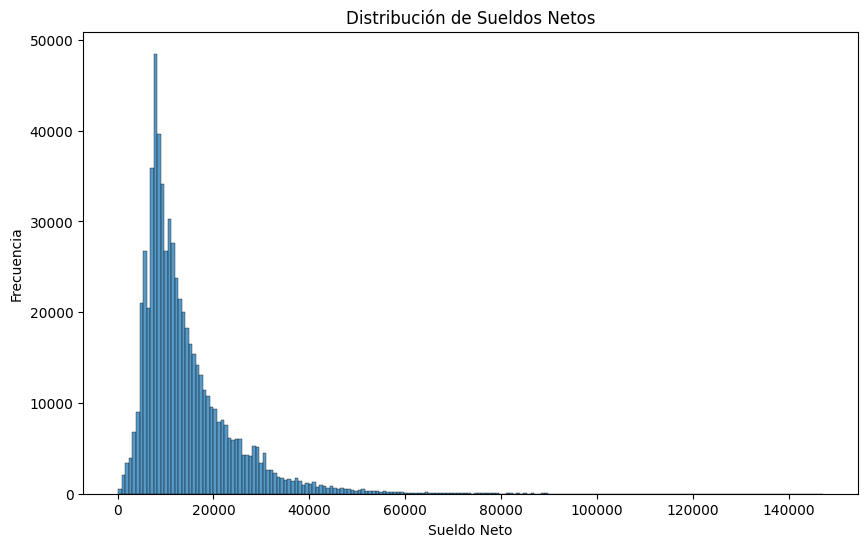

In [113]:
# Distribución de Sueldos Netos
plt.figure(figsize=(10, 6))
sns.histplot(df['Sueldo_Neto'], bins=200, edgecolor='black')
plt.title('Distribución de Sueldos Netos')
plt.xlabel('Sueldo Neto')
plt.ylabel('Frecuencia')
plt.savefig('imgs/histograma_sueldos.png')
plt.show()

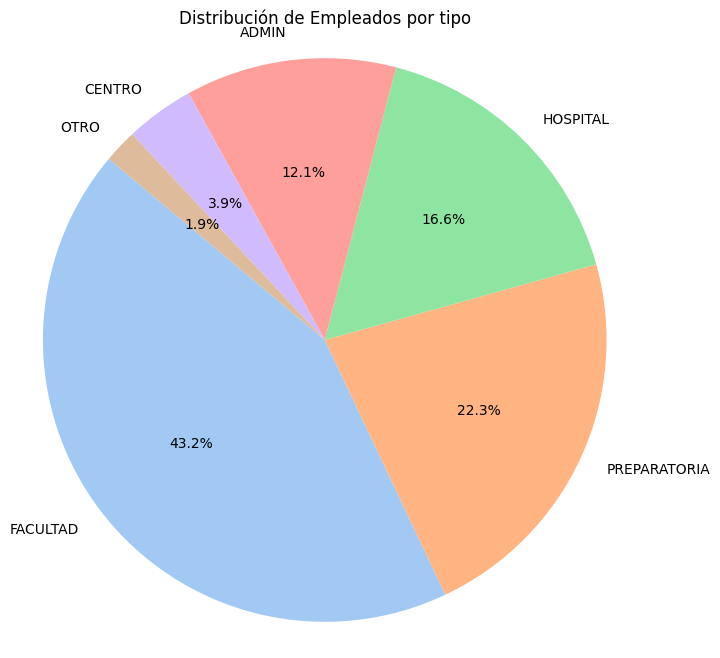

In [22]:
# Grafico de pastel por tipo.
count_type = df['Tipo'].value_counts()
plt.figure(figsize=(8, 8))
plt.title('Distribución de Empleados por tipo')
plt.pie(
    count_type,
    labels=count_type.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette('pastel')
)
plt.axis('equal')
plt.savefig('imgs/grafico_pastel_tipo.png')
plt.show()

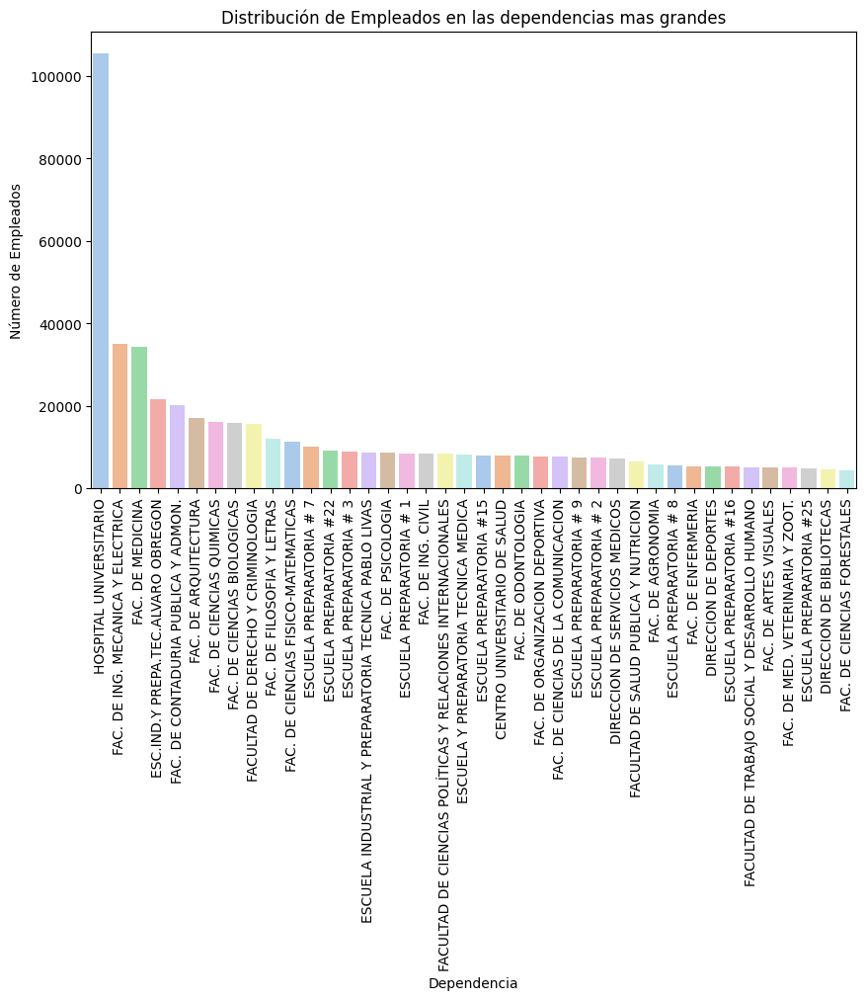

In [34]:
# Gráfico de barras de dependencias
count_dependecy = df['Dependencia'].value_counts()
count_dependecy_df = pd.DataFrame({
    'Dependencia': count_dependecy.index,
    'Conteo': count_dependecy.values
}).head(40)

plt.figure(figsize=(10, 6))
sns.barplot(x='Dependencia', y='Conteo', data=count_dependecy_df, palette='pastel',
            hue='Dependencia', dodge=False, legend=False)
plt.title('Distribución de Empleados en las dependencias mas grandes')
plt.xlabel('Dependencia')
plt.ylabel('Número de Empleados')
plt.xticks(rotation=90)
plt.savefig('imgs/grafico_barras_dependencias.png')
plt.show()

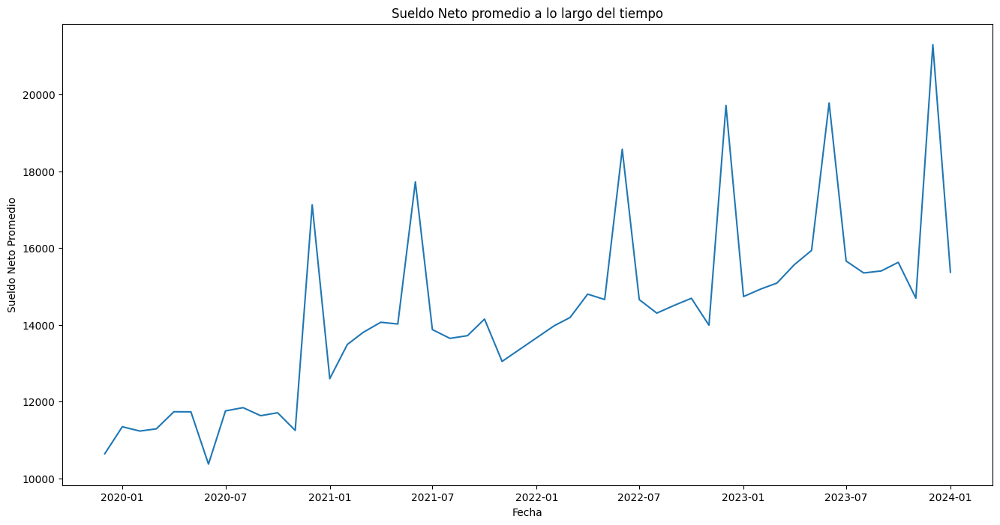

In [63]:
# Análisis de los sueldos
salary_date = df.groupby('Fecha')['Sueldo_Neto'].mean()
plt.figure(figsize=(16, 8))
plt.plot(salary_date.index, salary_date.values)
plt.title('Sueldo Neto promedio a lo largo del tiempo')
plt.xlabel('Fecha')
plt.ylabel('Sueldo Neto Promedio')
plt.savefig('imgs/grafico_sueldos.png')
plt.show()

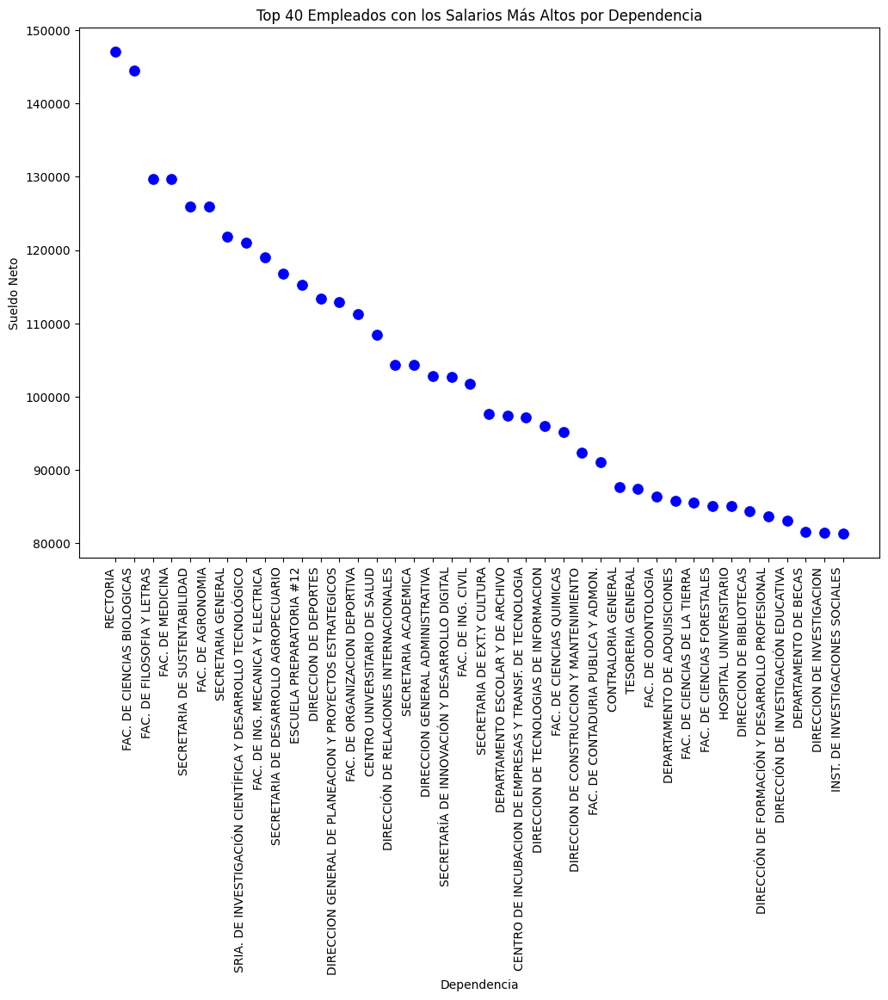

In [64]:
# Grafico de dispersión de los empleados con mas salario de cada dependecia.
top_salaries = max_salaries.nlargest(40, 'Sueldo_Neto')

# Crear el diagrama de puntos
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dependencia', y='Sueldo_Neto', data=top_salaries, s=100, color='blue')

# Configuración del gráfico
plt.title('Top 40 Empleados con los Salarios Más Altos por Dependencia')
plt.xlabel('Dependencia')
plt.ylabel('Sueldo Neto')
plt.xticks(rotation=90, ha='right')
plt.savefig('imgs/highest_salaries.png')

plt.show()

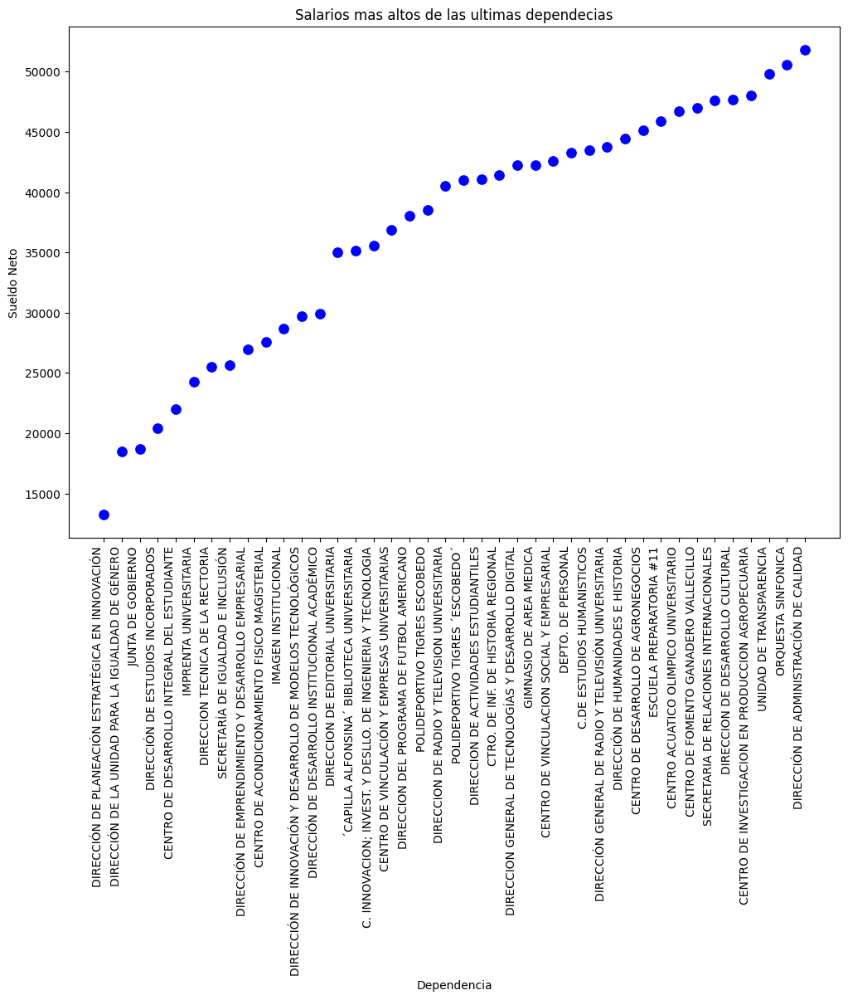

In [68]:
# Grafico de dispersión de los empleados con mas salarios de las dependecias mas bajas.
low_salaries = max_salaries.nsmallest(40, 'Sueldo_Neto')

# Crear el diagrama de puntos
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dependencia', y='Sueldo_Neto', data=low_salaries, s=100, color='blue')

# Configuración del gráfico
plt.title('Salarios mas altos de las ultimas dependecias')
plt.xlabel('Dependencia')
plt.ylabel('Sueldo Neto')
plt.xticks(rotation=90, ha='right')
plt.savefig('imgs/highest_salaries_bottom.png')

plt.show()

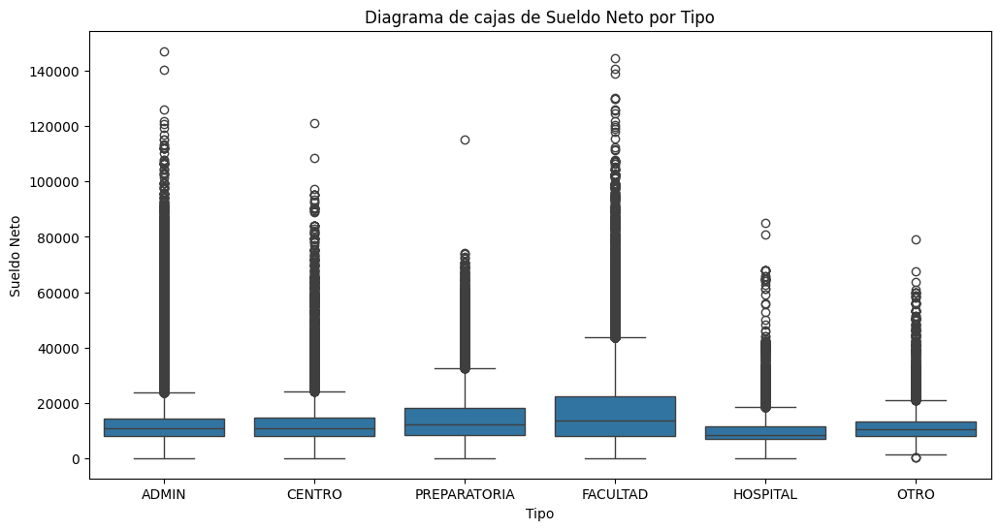

In [71]:
# Boxplot de Sueldo Neto por Tipo
plt.figure(figsize=(12, 6))
sns.boxplot(x='Tipo', y='Sueldo_Neto', data=df)
plt.title('Diagrama de cajas de Sueldo Neto por Tipo')
plt.xlabel('Tipo')
plt.ylabel('Sueldo Neto')
plt.show()

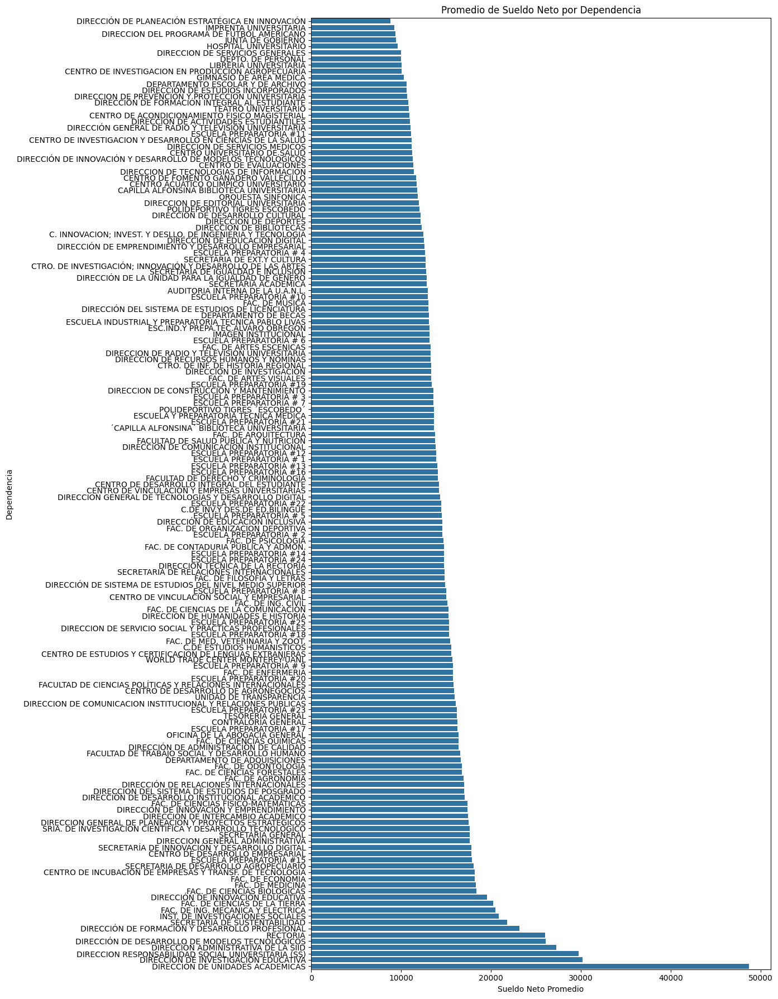

In [69]:
# Sueldo Neto por dependcia
avg_salary_dependecy = df.groupby('Dependencia')['Sueldo_Neto'].mean() \
                            .sort_values()

plt.figure(figsize=(14, 18))
sns.barplot(x=avg_salary_dependecy.values, y=avg_salary_dependecy.index)

plt.title('Promedio de Sueldo Neto por Dependencia')
plt.xlabel('Sueldo Neto Promedio')
plt.ylabel('Dependencia')
plt.tight_layout()
plt.show()

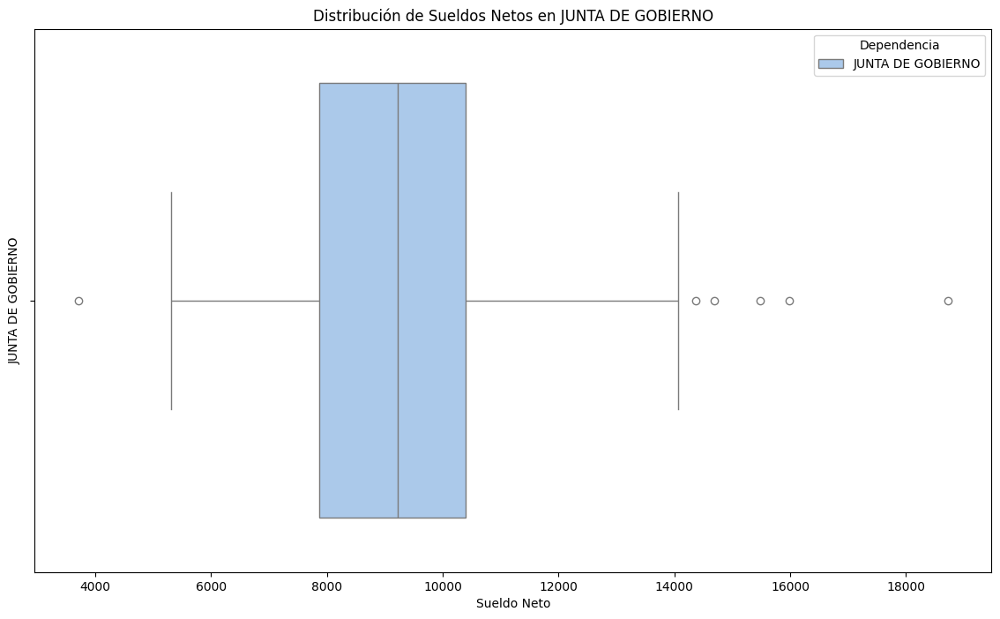

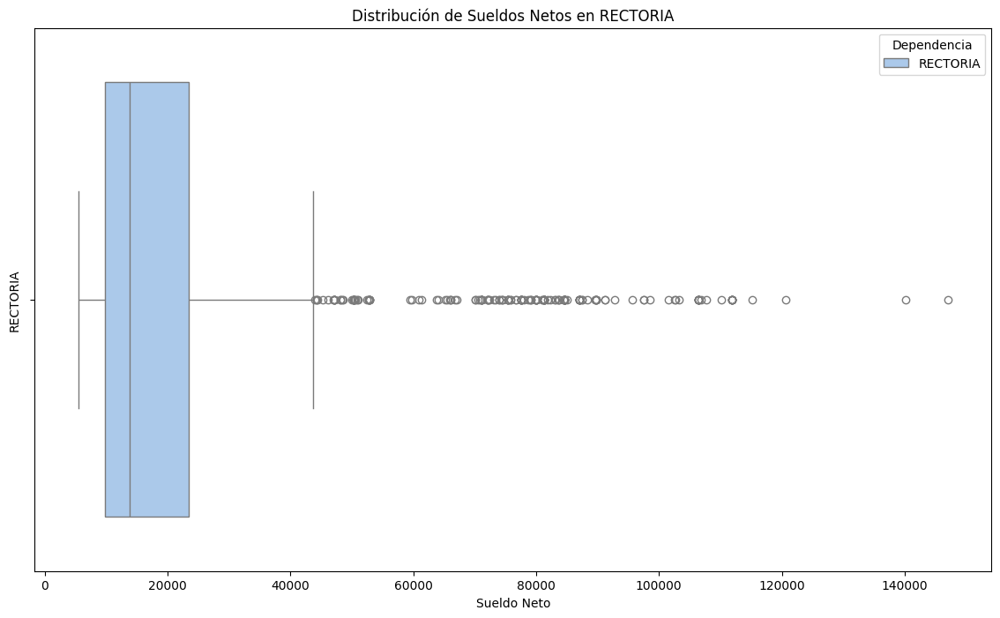

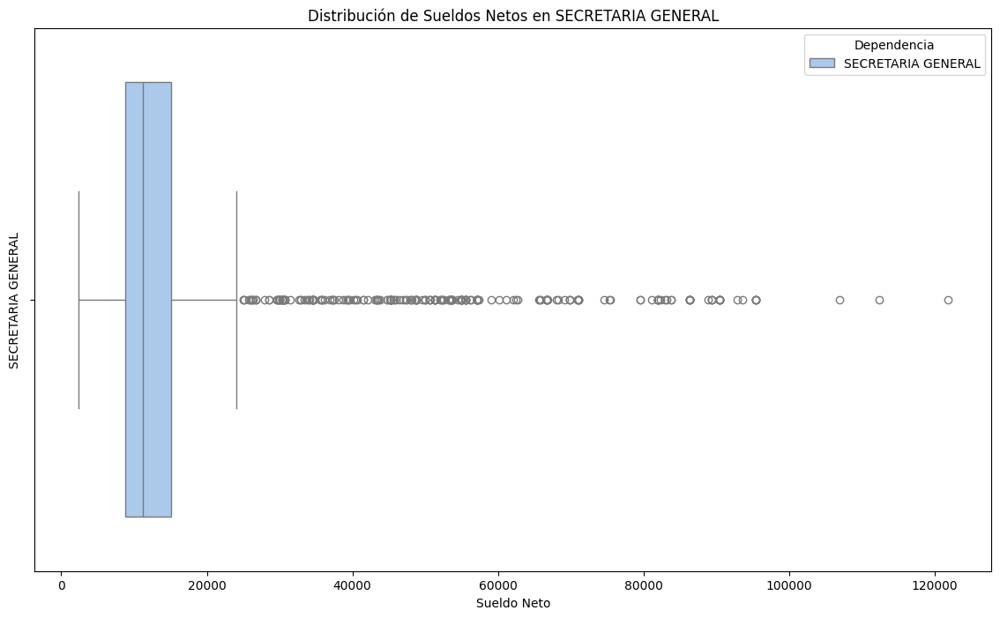

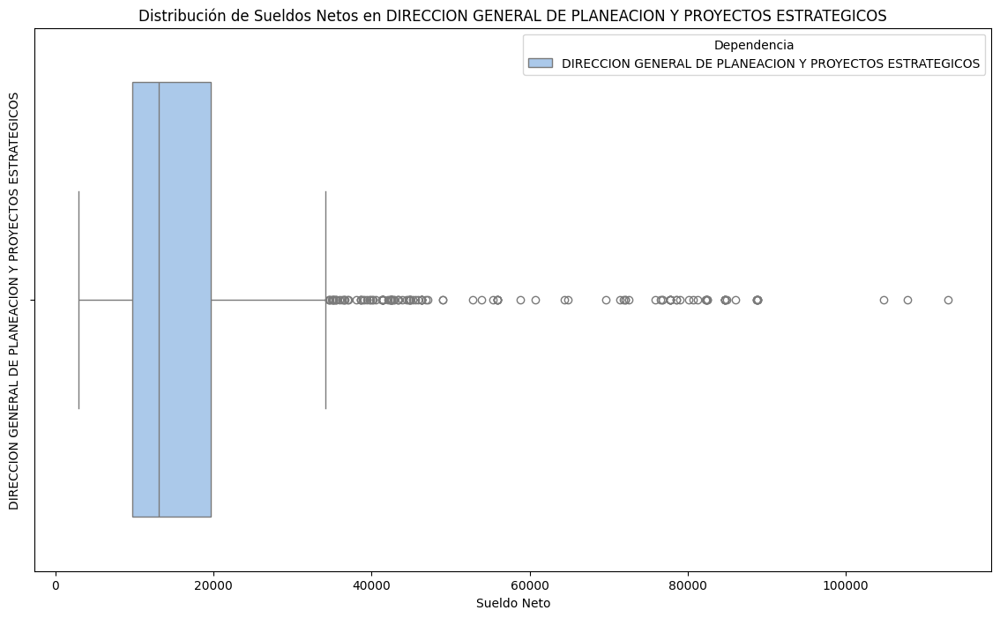

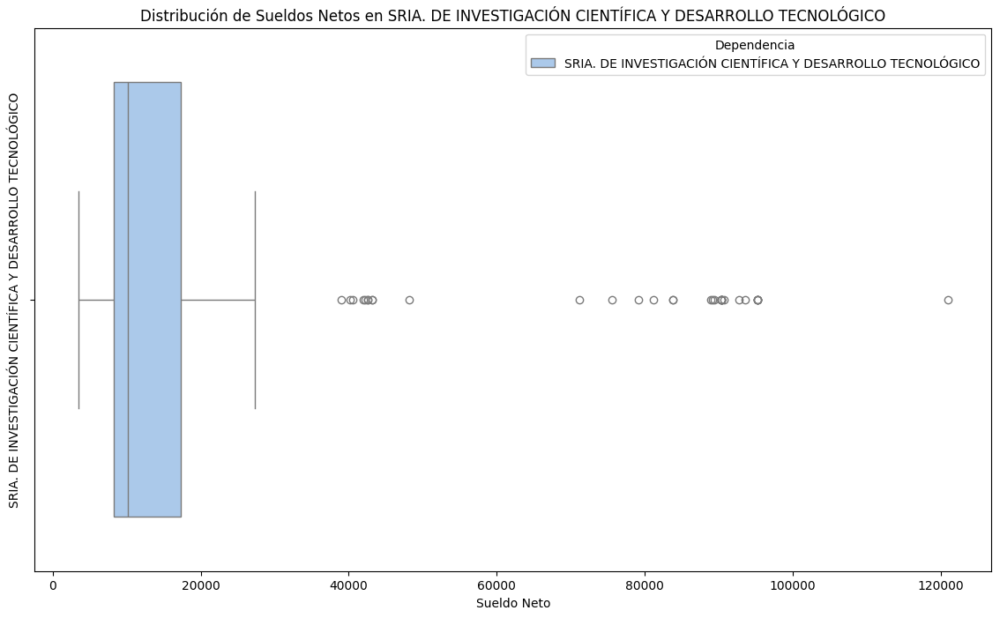

...

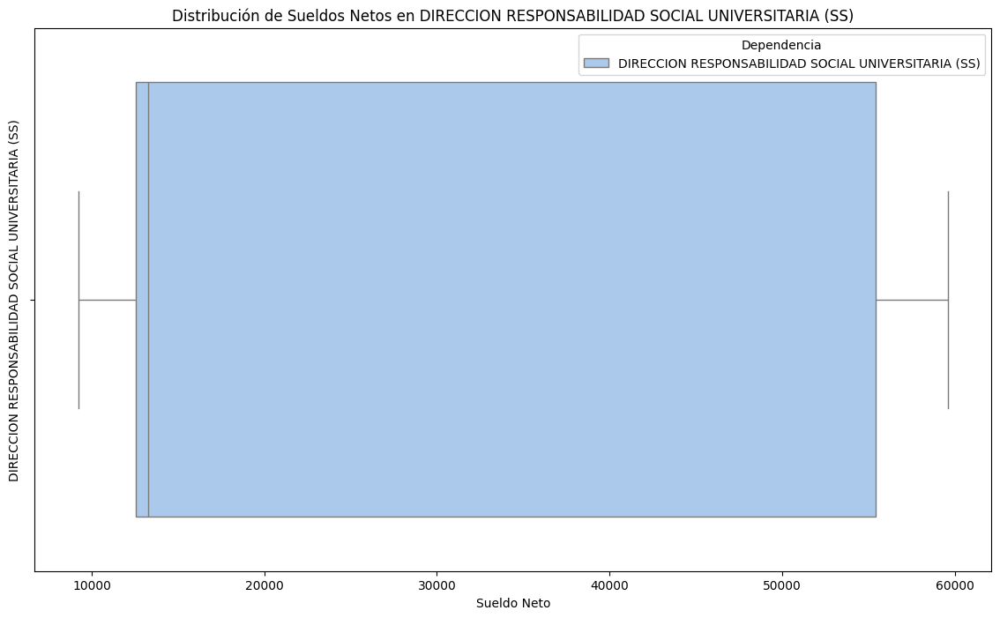

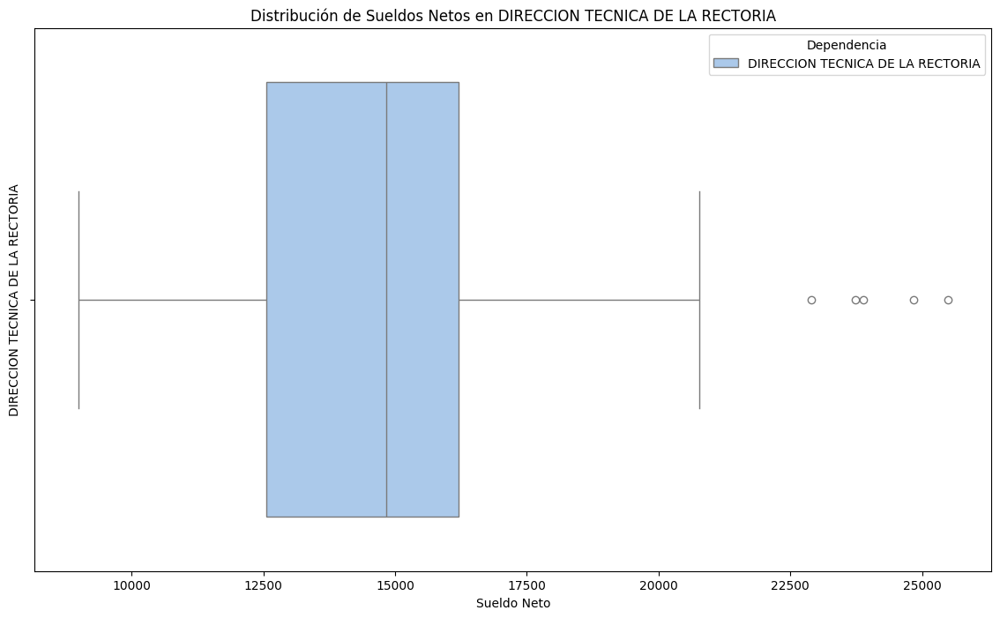

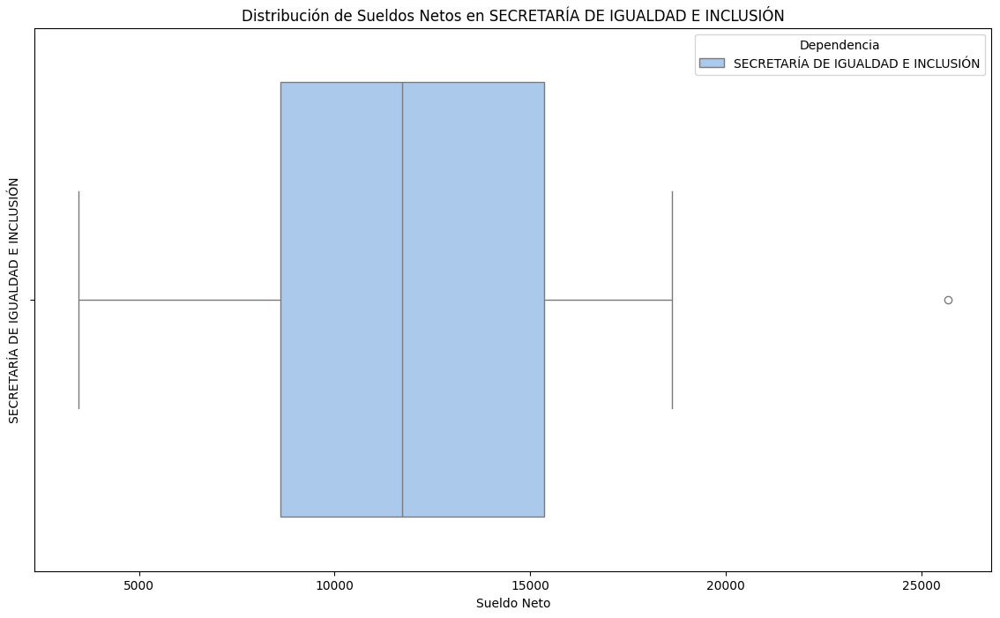

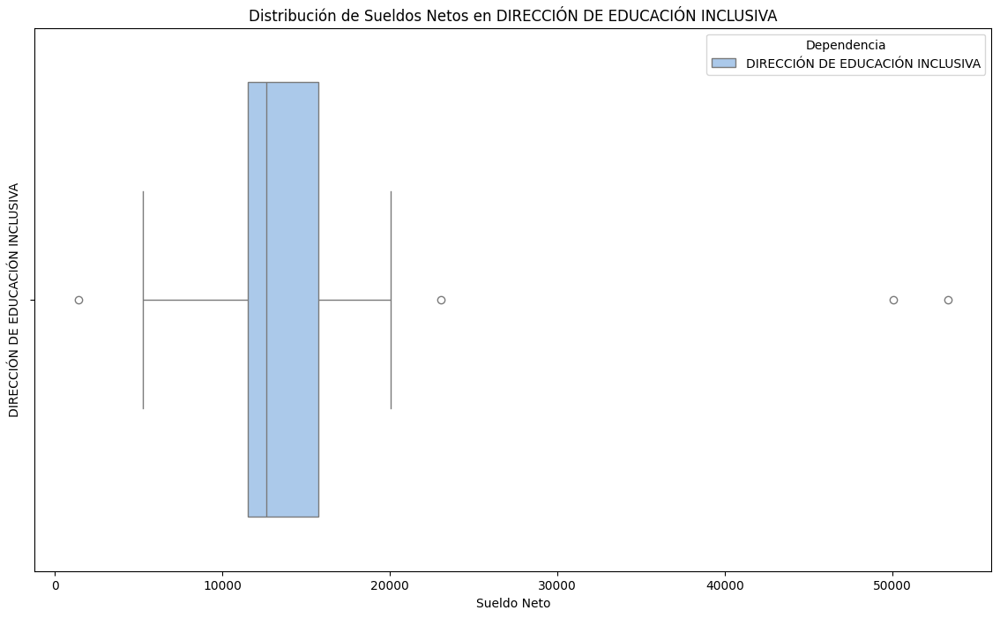

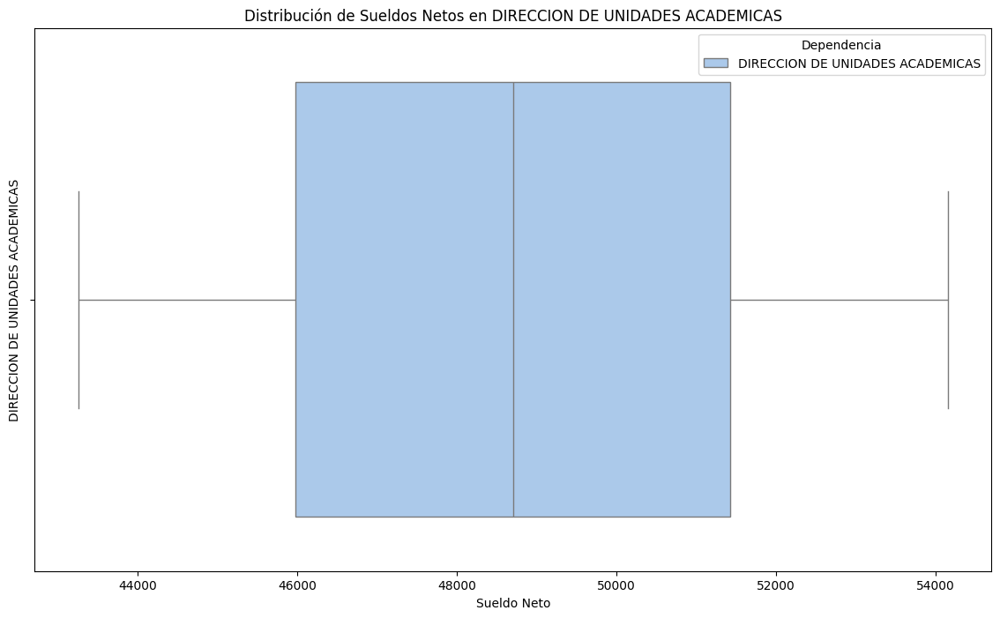

Graficas generadas.


In [97]:
# Todas las dependencias
dependencies = df['Dependencia'].unique()
# Gráficos por dependencia
for dependency in dependencies:
    dependency_df = df[df['Dependencia'] == dependency]
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=dependency_df, x='Sueldo_Neto', palette='pastel', hue='Dependencia')
    plt.title(f'Distribución de Sueldos Netos en {dependency}')
    plt.xlabel('Sueldo Neto')
    plt.ylabel(dependency)
    plt.savefig(f'imgs/sueldos_dependencias/boxplot_sueldos_{dependency.replace(" ", "_")}.png')
    plt.show()
    plt.close()

print("Graficas generadas.")

## 5. De alguna de las agrupaciones, hacer una pureba ANOVA, para ver si hay diferencias entre los elementos. recordando, hay que probar que las muestras son o no normales. si son normales anova para la prueba y t-student para saber quien es el diferente. Si la muestra no es normal, prueba con kruskall-wallis y tukey para saber quien es el diferente.  

In [99]:
# Pruebas de normalidad por dependencia
results = []
for dependency in dependencies:
    salaries = df[df['Dependencia'] == dependency]['Sueldo_Neto']
    stat, p_value = stats.kstest(salaries, 'norm')
    results.append((dependency, stat, p_value))

sorted_results = sorted(results, key=lambda x: x[2], reverse=True)

for dependency, stat, p_value in sorted_results:
    print(f'{dependency}: stat = {stat}, p-value = {p_value}')


JUNTA DE GOBIERNO: stat = 1.0, p-value = 0.0
RECTORIA: stat = 1.0, p-value = 0.0
SECRETARIA GENERAL: stat = 1.0, p-value = 0.0
DIRECCION GENERAL DE PLANEACION Y PROYECTOS ESTRATEGICOS: stat = 1.0, p-value = 0.0
SRIA. DE INVESTIGACIÓN CIENTÍFICA Y DESARROLLO TECNOLÓGICO: stat = 1.0, p-value = 0.0
CENTRO DE VINCULACION SOCIAL Y EMPRESARIAL: stat = 1.0, p-value = 0.0
SECRETARIA DE SUSTENTABILIDAD: stat = 1.0, p-value = 0.0
SECRETARIA DE DESARROLLO AGROPECUARIO: stat = 1.0, p-value = 0.0
DIRECCION GENERAL ADMINISTRATIVA: stat = 1.0, p-value = 0.0
CONTRALORIA GENERAL: stat = 1.0, p-value = 0.0
AUDITORIA INTERNA DE LA U.A.N.L.: stat = 1.0, p-value = 0.0
TESORERIA GENERAL: stat = 1.0, p-value = 0.0
OFICINA DE LA ABOGACÍA GENERAL: stat = 1.0, p-value = 0.0
DIRECCION DE PREVENCION Y PROTECCION UNIVERSITARIA: stat = 1.0, p-value = 0.0
DEPARTAMENTO ESCOLAR Y DE ARCHIVO: stat = 1.0, p-value = 0.0
DIRECCION DE RECURSOS HUMANOS Y NOMINAS: stat = 1.0, p-value = 0.0
DIRECCION DE TECNOLOGIAS DE INFORMA

In [112]:
# Obtener dependencias con muestras que no son normales
dependencias_no_normales = [dep for dep, _, p in sorted_results if p <= 0.05]

# Realizar Kruskal-Wallis para comparar los salarios entre las dependencias no normales
if dependencias_no_normales:
    data_kruskal = [df[df['Dependencia'] == dep]['Sueldo_Neto'].values for dep in dependencias_no_normales]
    h_statistic, p_value_kruskal = kruskal(*data_kruskal)
    
    print(f'Kruskal-Wallis: H-statistic = {h_statistic}, p-value = {p_value_kruskal}')
    
    if p_value_kruskal < 0.05:
        # Realizar prueba de Tukey para comparaciones múltiples si Kruskal-Wallis es significativo
        tukey_results = pairwise_tukeyhsd(df['Sueldo_Neto'], df['Dependencia'], alpha=0.05)
        print(tukey_results)
else:
    print('Todas las dependencias tienen muestras normales, por lo que no se requiere Kruskal-Wallis y Tukey.')
tukey_df = pd.DataFrame(tukey_results._results_table.data[1:], columns=tukey_results._results_table.data[0])
tukey_df.to_csv('datos/tukey_results.csv', index=False)

Kruskal-Wallis: H-statistic = 70138.59485108723, p-value = 0.0
                                                             Multiple Comparison of Means - Tukey HSD, FWER=0.05                                                             
                            group1                                                        group2                              meandiff  p-adj     lower       upper    reject
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                             AUDITORIA INTERNA DE LA U.A.N.L.   C. INNOVACION; INVEST. Y DESLLO. DE INGENIERIA Y TECNOLOGIA   -539.0509    1.0  -2812.0213   1733.9196  False
                             AUDITORIA INTERNA DE LA U.A.N.L.                                    C.DE ESTUDIOS HUMANISTICOS   2598.3148 0.0985   -109.8845   5306.5141  False
                             AUDITORIA INTERNA DE LA U.A.N.L.      